**[train/test].csv** - the training set metadata. 
Each row contains the data for a single posting. 
Multiple postings might have the exact same image ID, but with different titles or vice versa.

- posting_id - the ID code for the posting.

- image - the image id/md5sum.

- image_phash - a perceptual hash of the image.

- title - the product description for the posting.

- label_group - ID code for all postings that map to the same product. Not provided for the test set.

# Libraries

In [1]:
# python -m ensurepip --user
# pip install ImageHash --user

In [2]:
import plotly.express as px
import numpy as np
import pandas as pd

import os
# import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from wordcloud import WordCloud, STOPWORDS

#Text Color
from termcolor import colored

#Data Preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

#NLP
from sklearn.feature_extraction.text import CountVectorizer

#WordCloud
from wordcloud import WordCloud, STOPWORDS

#Text Processing
import re
import nltk
nltk.download('popular')

#Language Detection
!pip install langdetect
import langdetect

#Sentiment
from textblob import TextBlob

#ner
import spacy

#Vectorizer
from sklearn import feature_extraction, manifold

#Word Embedding
import gensim.downloader as gensim_api

#Topic Modeling
import gensim

from PIL import Image
import imagehash

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\MattSzymonski\AppData\Roaming\nltk_data.
[nltk_data]    |     ..
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\MattSzymonski\AppData\Roaming\nltk_data.
[nltk_data]    |     ..
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\MattSzymonski\AppData\Roaming\nltk_data.
[nltk_data]    |     ..
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\MattSzymonski\AppData\Roaming\nltk_data.
[nltk_data]    |     ..
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\MattSzymonski\AppData\Roaming\nltk_data.
[n

In [3]:
!pip install hvplot
import hvplot.pandas  # custom install

from glob import glob

#from bq_helper import BigQueryHelper
!pip install -e git+https://github.com/SohierDane/BigQuery_Helper#egg=bq_helper

from dask import bag, diagnostics 
from urllib import request

import missingno as msno

Traceback (most recent call last):
  File "c:\python39\lib\runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\python39\lib\runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "C:\Python39\Scripts\pip.exe\__main__.py", line 4, in <module>
ModuleNotFoundError: No module named 'pip'


Traceback (most recent call last):
  File "c:\python39\lib\runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\python39\lib\runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "C:\Python39\Scripts\pip.exe\__main__.py", line 4, in <module>
ModuleNotFoundError: No module named 'pip'


In [4]:
from PIL import Image

# Setup

### Load CSV files with data

In [5]:
train = pd.read_csv('./input/train.csv')
test = pd.read_csv('./input/test.csv')
sample = pd.read_csv('./input/sample_submission.csv')

### Load image files

In [6]:
#Image Folder Paths
train_jpg_directory = './input/train_images'
test_jpg_directory = './input/test_images'

In [7]:
# Retuns list of paths combined with image file names
def getImagePaths(path): 
    image_names = []
    for dirname, _, filenames in os.walk(path):
        for filename in filenames:
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

In [8]:
#Get complete image paths for train and test datasets
train_images_path = getImagePaths(train_jpg_directory)
test_images_path = getImagePaths(test_jpg_directory)

<hr class="solid">

# Data Exploration - Tabular Analysis

In [9]:
train.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


In [10]:
test.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


In [11]:
print(f"Training Dataset Shape: {colored(train.shape, 'yellow')}")
print(f"Test Dataset Shape: {colored(test.shape, 'yellow')}")

Training Dataset Shape: (34250, 5)
Test Dataset Shape: (3, 4)


### Unique Values

In [12]:
for col in train.columns:
    print("Number of unique " + col + ": " + colored(str(len(train[col].unique())), 'yellow'))

Number of unique posting_id: 34250
Number of unique image: 32412
Number of unique image_phash: 28735
Number of unique title: 33117
Number of unique label_group: 11014


### Number of Images

In [13]:
print(f"Number of train images: {colored(len(train_images_path), 'yellow')}")
print(f"Number of test images:  {colored(len(test_images_path), 'yellow')}")

Number of train images: 32412
Number of test images:  3


In [14]:
# Displays images in grid
def display_multiple_img(images_paths, rows, cols):
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

### Example Train Images

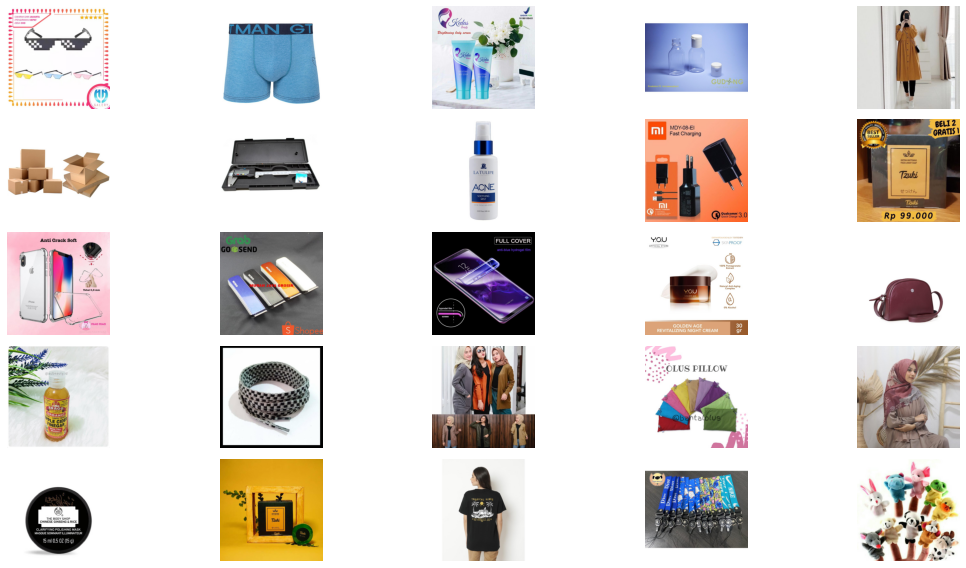

In [15]:
display_multiple_img(train_images_path[50:100], 5, 5)

### Test Images

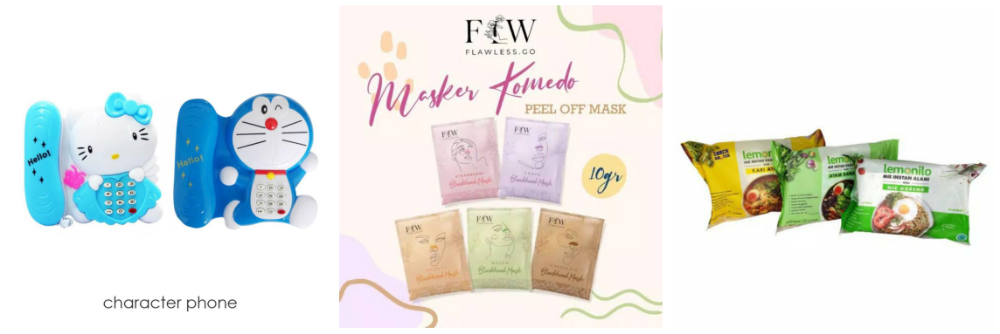

In [16]:
display_multiple_img(test_images_path[0:3], 1, 3)

<hr class="solid">

# Data Exploration - Title Analysis

### Wordcloud

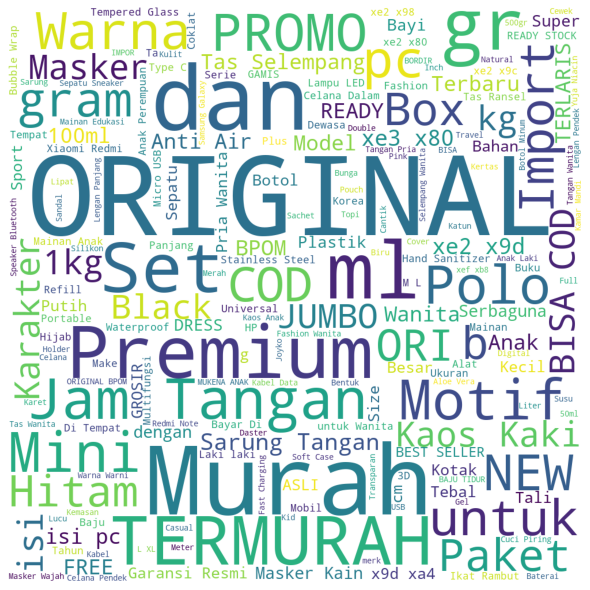

In [17]:
stopwords = set(STOPWORDS) 
wordcloud = WordCloud(width = 1000, height = 1000, background_color ='white', min_font_size = 10, stopwords = stopwords,).generate(' '.join(train['title']))                 
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show() 

### Cleaning Titles (Natural Language Processing)

In [18]:
def preprocess_text(text, flg_stemm=False, flg_lemm=True):

    lst_stopwords = nltk.corpus.stopwords.words("english")
    
    ## clean (convert to lowercase and remove punctuations and characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())
            
    ## Tokenize (convert from string to list)
    lst_text = text.split()
    ## remove Stopwords
    if lst_stopwords is not None:
        lst_text = [word for word in lst_text if word not in 
                    lst_stopwords]
                
    ## Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        lst_text = [ps.stem(word) for word in lst_text]
                
    ## Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()    
        lst_text = [lem.lemmatize(word) for word in lst_text]
            
    ## back to string from list
    text = " ".join(lst_text)
    return text

In [19]:
#Clean Address
train["clean_title"] = train["title"].apply(lambda x: preprocess_text(x, flg_stemm=False, flg_lemm=True, ))

In [20]:
#Length of Title
train['clean_title_len'] = train['clean_title'].apply(lambda x: len(x))

#Word Count
train['clean_title_word_count'] =train["clean_title"].apply(lambda x: len(str(x).split(" ")))

#Character Count
train['clean_title_char_count'] = train["clean_title"].apply(lambda x: sum(len(word) for word in str(x).split(" ")))

#Average Word Length
train['clean_title_avg_word_length'] = train['clean_title_char_count'] / train['clean_title_word_count']

### Distribution Plots

In [21]:
def plot_distribution(data, x, title):
    fig = px.histogram(data, x = x, width = 1000, height = 500, title = title)    
    fig.show()

### Title Length Distribution - Character Count

In [22]:
plot_distribution(train, x = 'clean_title_char_count', title = 'Title Length Distribution - Character Count')

### Title Length Distribution - Word Count

In [23]:
plot_distribution(train, x = 'clean_title_word_count', title = 'Title Length Distribution - Word Count')

### Word Popularity in Titles

In [24]:
ds = pd.DataFrame.from_dict(list(wordcloud.words_.items()))
ds.columns = ['word', 'score']
ds = ds.sort_values(['score'])
ds['word'] = ds['word'].astype(str)

fig = px.bar(
    ds.tail(30), 
    x="score", 
    y="word", 
    orientation='h', 
    title='Top 30 most popular words in the titles', 
    width=1000, 
    height=1000
)

fig.show()

# Data Exploration - Label Group Analysis

In [25]:
print(f"Number of unique Label Groups: {colored(train.label_group.nunique(), 'yellow')}")

Number of unique Label Groups: 11014


### Image Label Groups by Number of Images

In [26]:
ds = train['label_group'].value_counts().reset_index()
ds.columns = ['label_group', 'products_count']
ds['label_group'] = ds['label_group'].astype(str)
ds = ds.sort_values(['products_count'])

fig = px.bar(
    ds.tail(50), 
    x="products_count", 
    y="label_group", 
    title='Top 50 groups by number of products', 
    width=1000, 
    height=600
)
fig.update_xaxes(title_text='number of images',row=1, col=1)
fig.show()

### Image Label Groups by Number of Images

In [27]:
top_names = train['label_group'].value_counts().index.tolist()
top_values = train['label_group'].value_counts().tolist()

d = {'label':top_names,'image_count':top_values}
df = pd.DataFrame(d)

fig = px.histogram(df, x = top_values, width = 1000, height = 500, title = "Number of label groups by number of images in group")    
fig.update_yaxes(title_text='number of label groups',row=1, col=1)
fig.update_xaxes(title_text='number of images',row=1, col=1)
fig.update_xaxes(type='category')
fig.update_xaxes(categoryorder="total descending")
fig.show()


### Images In Largest Groups

In [28]:
def plot_images(group):
    
    plot_list = train[train['label_group'] == group]
    plot_list = plot_list['image'].tolist()
    images_number = len(plot_list)
    size = np.sqrt(images_number)
    if int(size)*int(size) < images_number:
        size = int(size) + 1
        
    plt.figure(figsize=(20, 20))
    
    ind=0
    for image_id in plot_list:
        plt.subplot(size, size, ind + 1)
        image = cv2.imread(os.path.join(train_jpg_directory, image_id))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.imshow(image)
        plt.title(image_id, fontsize=6)
        plt.axis("off")
        ind+=1
    plt.show()

**Product 1163569239**

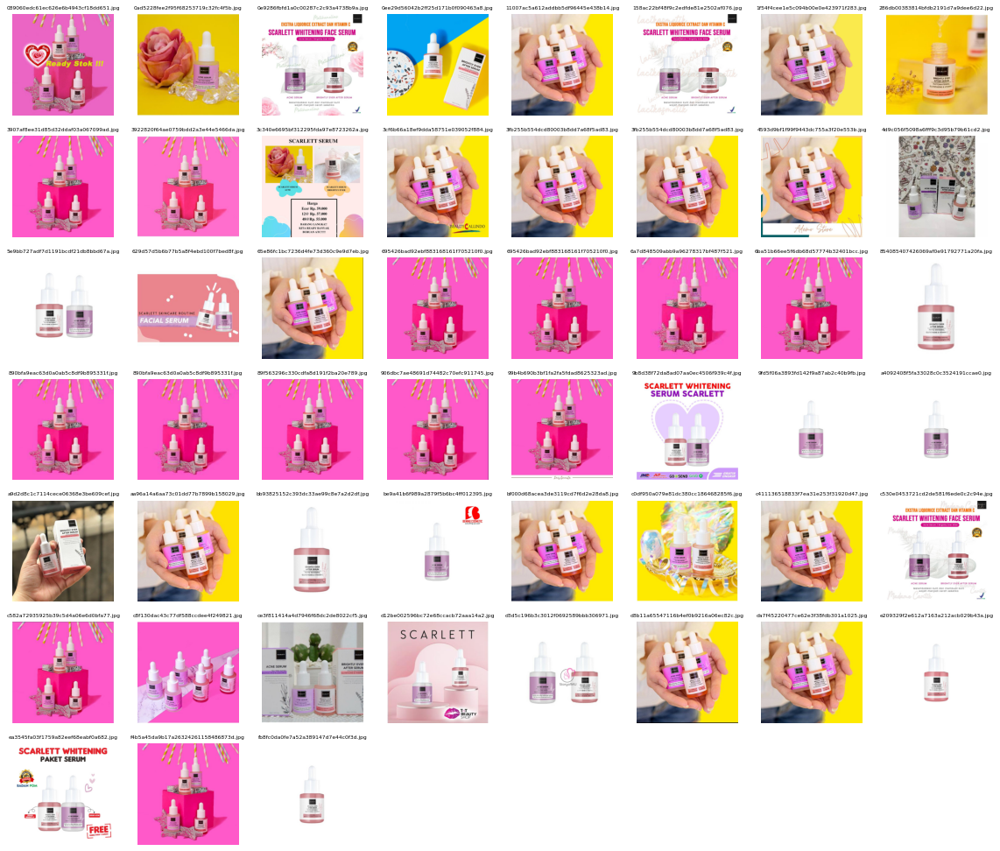

Total number of items in group 1163569239: 51, number of unique titles: 50


In [29]:
plot_images(1163569239)
sample = train[train['label_group'] == 1163569239]
print('Total number of items in group 1163569239: ' + str(len(sample)) + ', number of unique titles: ' + str(sample['title'].nunique()))

**Product 994676122**

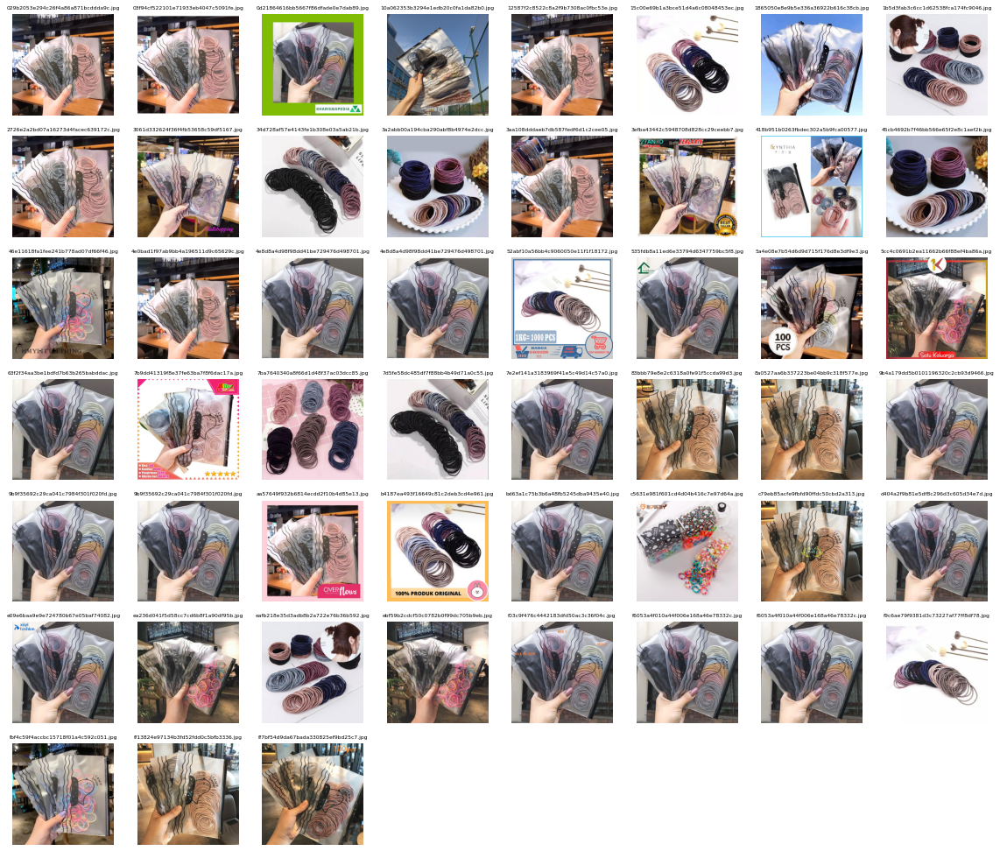

Total number of items in group 994676122: 51, number of unique titles: 45


In [30]:
plot_images(994676122)
sample = train[train['label_group'] == 994676122]
print('Total number of items in group 994676122: ' + str(len(sample)) + ', number of unique titles: ' + str(sample['title'].nunique()))

In [31]:
# Data Exploration - Image Exploration

In [32]:
### Image Dimension

In [ ]:
### Phash

Each row contains precalculated phash value for the image in it.
Phash alghoritm breaks images into fragments (in this dataset - 8x8), then analyzes the image structure on luminance and simply assigns True or False to each of 16 of matrix cells depending on the value (above or below the mean).

Matching phashes can be easily used to detect if images are similar.

For instance, the phash matrix of the first image in data set looks like this:

In [37]:
imagehash.hex_to_hash(train['image_phash'][0])

array([[ True, False, False,  True, False,  True, False, False],
       [ True, False, False,  True, False,  True,  True,  True],
       [False,  True, False, False,  True,  True,  True,  True],
       [ True, False, False,  True, False, False,  True,  True],
       [False,  True,  True,  True,  True,  True, False,  True],
       [False,  True, False, False,  True,  True, False, False],
       [False, False,  True, False, False,  True, False, False],
       [False, False,  True,  True, False, False,  True,  True]])